# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** xx

**Author 1 (sciper):** Pranav Krishna (359822)  
**Author 2 (sciper):** Student Name 2 (xxxxx)   
**Author 3 (sciper):** Student Name 3 (xxxxx)   

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [11]:
import tarfile
import os

data_base_path = os.path.join(os.pardir,'data')
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

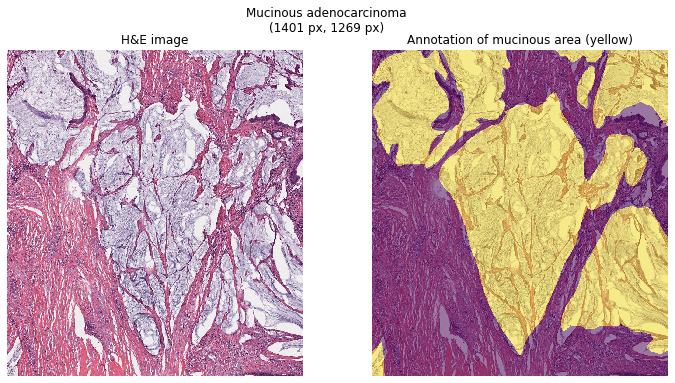

In [12]:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

<ipython-input-13-f9396ed5c036>:21: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


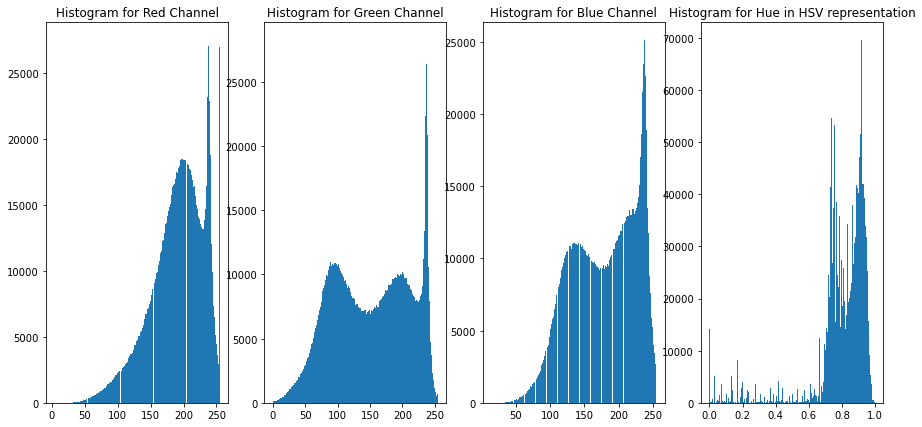

In [13]:
from skimage.color import rgb2hsv
hue = rgb2hsv(adeno_img)[:,:,0]
r_img = adeno_img[:,:,0]
g_img = adeno_img[:,:,1]
b_img = adeno_img[:,:,2]

nb_bins = 256
fig, ax = plt.subplots(ncols = 4, figsize=(15, 7))
ax[0].hist(r_img.flatten(), bins = nb_bins)
ax[0].set_title('Histogram for Red Channel')

ax[1].hist(g_img.flatten(), bins = nb_bins)
ax[1].set_title('Histogram for Green Channel')

ax[2].hist(b_img.flatten(), bins = nb_bins)
ax[2].set_title('Histogram for Blue Channel')

ax[3].hist(hue.ravel(), bins = 200)
ax[3].set_title('Histogram for Hue in HSV representation')

fig.show()

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$








Here, I and J are the dimension of the image.

 Red Thresholds  [155.90506949 212.52091161]  
 Green thresholds  [155.90506949 212.52091161]  
 Blue thresholds  [141.05863859 220.0151463 ]  
 Hue thresholds [0.21394141 0.83704018]
 Red Error  0.45233703945566295  
 Green error  0.26459598541849816  
 Blue error  0.27965333778810475  
 Hue error 0.49414439421577183


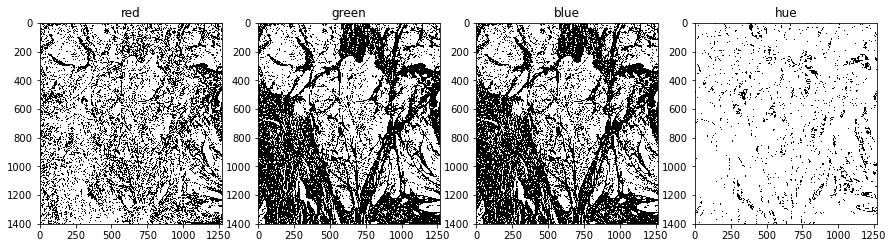

In [50]:
import sklearn
from sklearn.mixture import GaussianMixture

#Fit the model
gm_red = GaussianMixture(n_components=2).fit(r_img.reshape(-1,1))
gm_green = GaussianMixture(n_components=2).fit(g_img.reshape(-1,1))
gm_blue = GaussianMixture(n_components=2).fit(b_img.reshape(-1,1))
gm_hue = GaussianMixture(n_components=2).fit(hue.reshape(-1,1))

#Make predictions
r_binary = np.array([gm_red.means_[label] for label in gm_red.predict(r_img.reshape(-1,1))])
g_binary = np.array([gm_green.means_[label] for label in gm_green.predict(g_img.reshape(-1,1))])
b_binary = np.array([gm_blue.means_[label] for label in gm_blue.predict(b_img.reshape(-1,1))])
hue_binary = np.array([gm_hue.means_[label] for label in gm_hue.predict(hue.reshape(-1,1))])

#Reshape
r_binary = r_binary.reshape(1,-1)[0].reshape(im_h, im_w)
g_binary = g_binary.reshape(1,-1)[0].reshape(im_h, im_w)
b_binary = b_binary.reshape(1,-1)[0].reshape(im_h, im_w)
hue_binary = hue_binary.reshape(1,-1)[0].reshape(im_h, im_w)

#REsults
fig, axs = plt.subplots(ncols=4, figsize=(15,5))
axs[0].imshow(r_binary, interpolation='nearest',cmap='gray')
axs[0].set_title('red')
axs[1].imshow(g_binary, interpolation='nearest',cmap='gray')
axs[1].set_title('green')
axs[2].imshow(b_binary, interpolation='nearest',cmap='gray')
axs[2].set_title('blue')
axs[3].imshow(hue_binary, interpolation = 'nearest',cmap='gray')
axs[3].set_title('hue')

# Results of Binary thresholding
print(" Red Thresholds ", np.unique(r_binary), " \n Green thresholds ",np.unique(r_binary), " \n Blue thresholds ", np.unique(b_binary), " \n Hue thresholds", np.unique(hue_binary))

#Showing error
r_01 = (r_binary > 160)
g_01 = (g_binary > 160)
b_01 = (b_binary > 160)
hue_01 = (hue_binary > 0.8)
r_error = 1 - np.mean((adeno_gt==r_01))
g_error = 1 - np.mean((adeno_gt==g_01))
b_error = 1 - np.mean((adeno_gt==b_01))
hue_error = 1 - np.mean((adeno_gt==hue_01))
print(" Red Error ", r_error, " \n Green error ",g_error, " \n Blue error ", b_error, " \n Hue error", hue_error)

#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

In [51]:
mask_thesholding = g_01

# TODO: replace variabel with your own threshod
#### We see that Green has the lowest error. Thus, use the green mask 
mask_thesholding = g_01#np.zeros_like(adeno_gt)

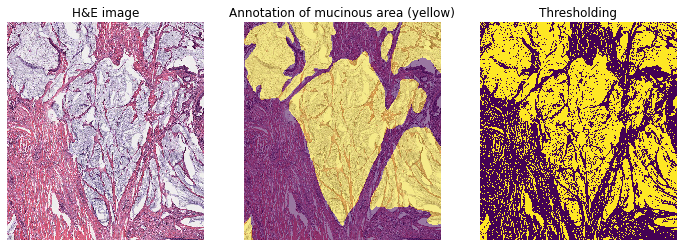

In [52]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_thesholding, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

<ipython-input-22-6837773d7c78>:12: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


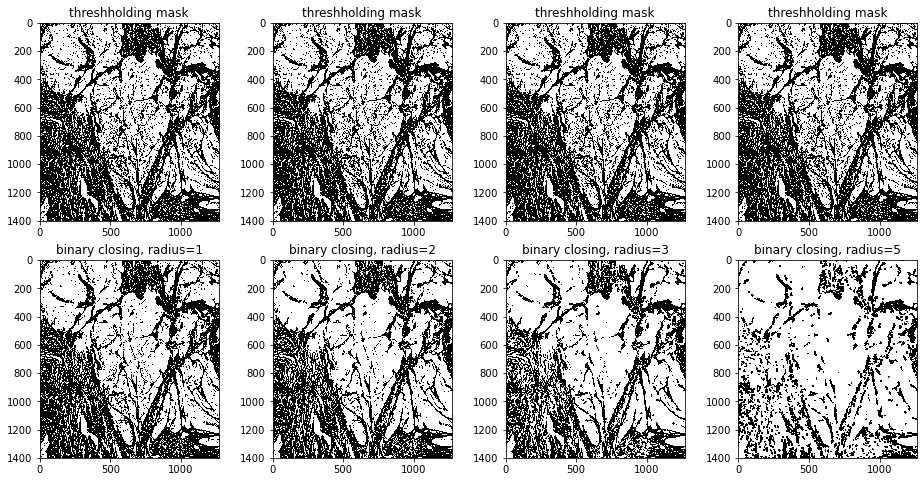

In [22]:
# Part A Closing
from skimage import morphology
fig, axs = plt.subplots(ncols=4,nrows=2,figsize = (16,8))

Radius = [1,2,3,5]
for i in range(4):
    closing = morphology.binary_closing(g_01,morphology.disk(radius=Radius[i]))
    axs[0][i].imshow(g_01, interpolation='nearest',cmap='gray')
    axs[0][i].set_title("threshholding mask")
    axs[1][i].imshow(closing, interpolation='nearest',cmap='gray')
    axs[1][i].set_title(f'binary closing, radius={Radius[i]}')
fig.show()

<ipython-input-31-6ad2e7d947ff>:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


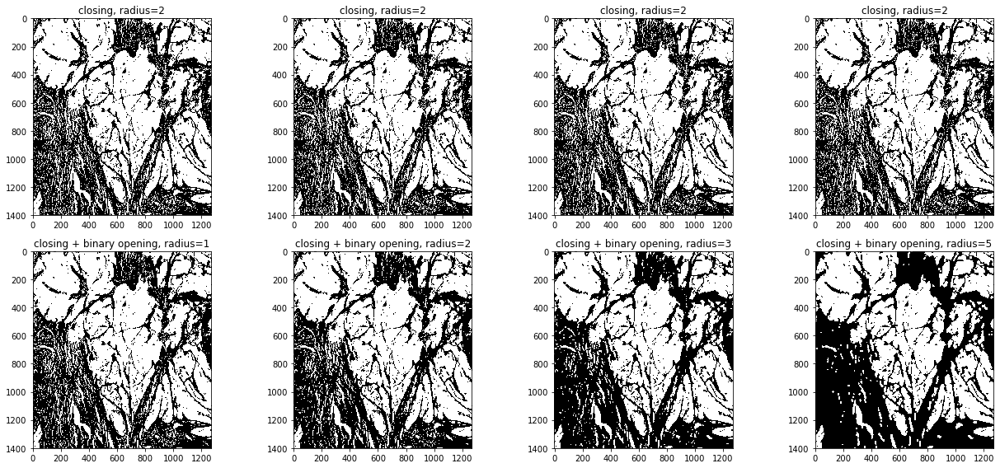

In [31]:
#Part A Opening
# In closing, we see that the closing in part a gives the best result for radius 2. The radius 3 and 5 appear overdone and compared to radius1, radius 2 looks better
#Thus, we proceed from the result of closing with radius 2
fig, axs = plt.subplots(ncols=4,nrows=2,figsize = (18,8))

closing = morphology.binary_closing(g_01, morphology.disk(radius=2))
Radius = [1,2,3,5]
for i in range(4):
    opening = morphology.binary_opening(closing,morphology.disk(radius=Radius[i]))
    axs[0][i].imshow(closing, interpolation='nearest',cmap='gray')
    axs[0][i].set_title('closing, radius=2')
    axs[1][i].imshow(opening, interpolation='nearest',cmap='gray')
    axs[1][i].set_title(f'closing + binary opening, radius={Radius[i]}')
fig.show()
fig.tight_layout()

<ipython-input-43-a9a8ada391da>:14: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


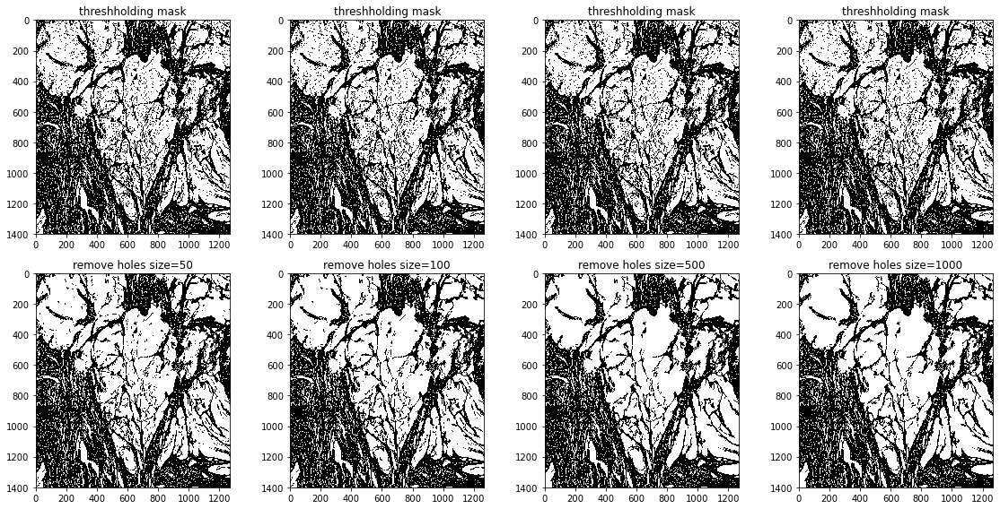

In [43]:
#Part B Remove small holes
from skimage import morphology
fig, axs = plt.subplots(ncols=4,nrows=2,figsize = (16,8))

#opening = morphology.binary_opening(closing,morphology.disk(radius=5))
thresh = [50,100,500,1000]
for i in range(4):
    no_holes = morphology.remove_small_holes(g_01,area_threshold=thresh[i])
    axs[0][i].imshow(g_01, interpolation='nearest',cmap='gray')
    axs[0][i].set_title("threshholding mask")
    axs[1][i].imshow(no_holes, interpolation='nearest',cmap='gray')
    axs[1][i].set_title(f"remove holes size={thresh[i]}")
    print()
fig.show()
fig.tight_layout()

<ipython-input-44-033a4d22dd98>:16: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


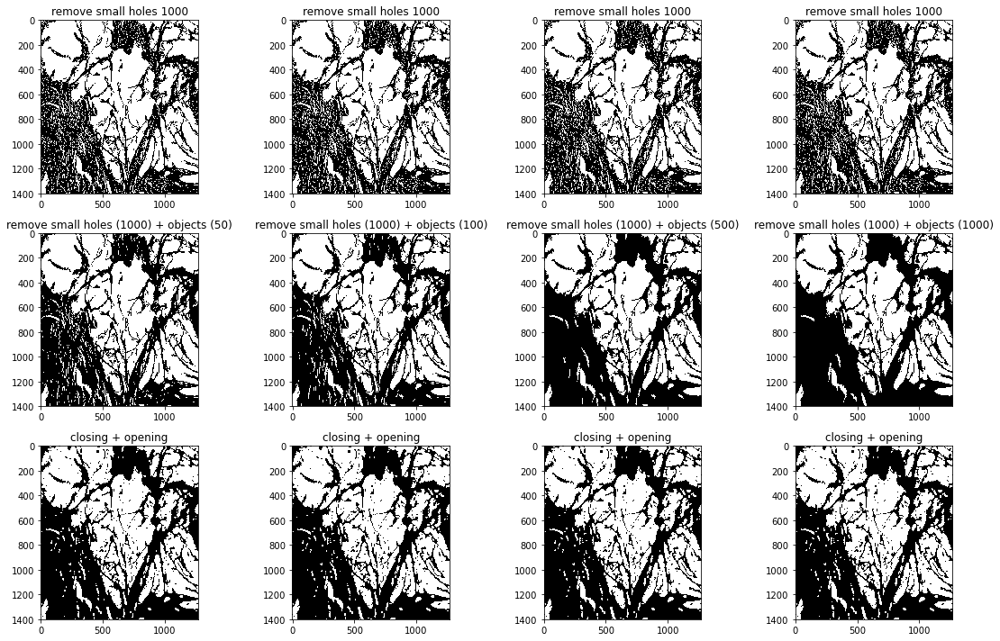

In [44]:
#Part B: Remove small objects
# We see that each succsesive image is better in terms of removing extra artefacts
#Thus, we proceed with the threshold 1000
fig, axs = plt.subplots(ncols=4,nrows=3,figsize = (16,10))

no_holes = morphology.remove_small_holes(g_01,area_threshold=1000)
size = [50,100,500,1000]
for i in range(4):
    no_objects = morphology.remove_small_objects(no_holes,min_size = size[i])
    axs[0][i].imshow(no_holes, interpolation='nearest',cmap='gray')
    axs[0][i].set_title("remove small holes 1000")
    axs[1][i].imshow(no_objects, interpolation='nearest',cmap='gray')
    axs[1][i].set_title(f"remove small holes (1000) + objects ({size[i]})")    
    axs[2][i].imshow(opening, interpolation='nearest',cmap='gray')
    axs[2][i].set_title(f"closing + opening")    
fig.show()
fig.tight_layout()

closing 1 0.15480555653988004
closing 2 0.14837482401684265 

closing 1 0.14847663129285682
closing 2 0.14202621227998236 

closing 1 0.1387914407641958
closing 2 0.13365439185901773 

closing 1 0.12484553136367194
closing 2 0.12314911841086151 



<ipython-input-45-da79c3f2002b>:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


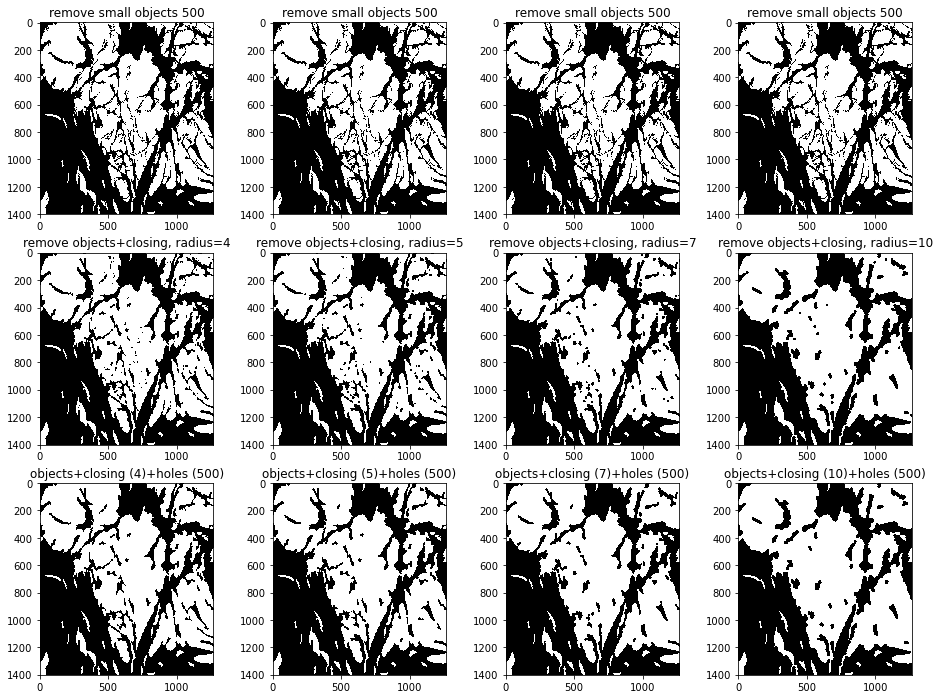

In [45]:
# C Combining multiple methods
fig, axs = plt.subplots(ncols=4,nrows=3,figsize = (16,12))

no_objects = morphology.remove_small_objects(no_holes,min_size = 500)
Radius = [4,5,7,10]
for i in range(4):
    closing_1 = morphology.binary_closing(no_objects,morphology.disk(radius=Radius[i]))
    closing_2 = morphology.remove_small_holes(closing_1,500)
    axs[0][i].imshow(no_objects, interpolation='nearest',cmap='gray')
    axs[0][i].set_title("remove small objects 500")
    axs[1][i].imshow(closing_1, interpolation='nearest',cmap='gray')
    axs[1][i].set_title(f"remove objects+closing, radius={Radius[i]}")
    axs[2][i].imshow(closing_2, interpolation='nearest',cmap='gray')
    axs[2][i].set_title(f"objects+closing ({Radius[i]})+holes (500)")
    print('closing 1',1 - np.mean((adeno_gt==closing_1)))
    print('closing 2',1 - np.mean((adeno_gt==closing_2)),'\n')
fig.show()
#This does not look satisfactory.
# We try one more thing

### Below we drew the final result of the best morphological combination according to error and object separability

error 0.13531199430329233


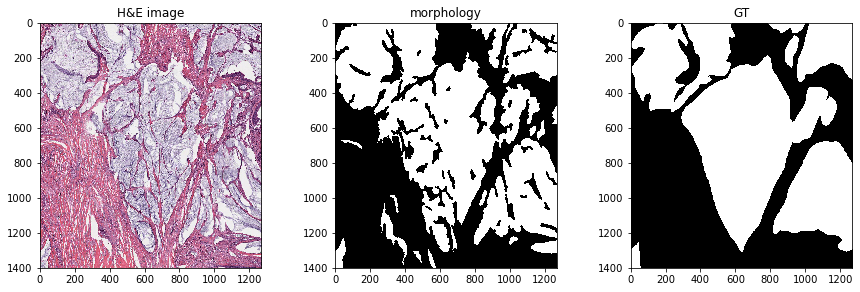

In [54]:
no_holes = morphology.remove_small_holes(g_01,area_threshold=1000)
no_objects = morphology.remove_small_objects(no_holes,min_size = 1000)
closing_1 = morphology.binary_closing(no_objects,morphology.disk(radius=5))
no_holes_2 = morphology.remove_small_holes(closing_1,500)
mask_morph = no_holes_2
fig, axs = plt.subplots(ncols=3, figsize = (15,4.5))
axs[0].imshow(adeno_img, interpolation='nearest')
axs[0].set_title("H&E image")
axs[1].imshow(mask, interpolation='nearest',cmap='gray')
axs[1].set_title("morphology")
axs[2].imshow(adeno_gt, interpolation='nearest',cmap='gray')
axs[2].set_title("GT")
print('error',1 - np.mean((adeno_gt==mask_morph)))

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

In [9]:
# # TODO
# import skimage.io
# import sys
# import numpy as np
# import os
# sys.setrecursionlimit(150000)
# data_base_path = os.path.join('data')
# print(data_base_path)
# data_folder = 'lab-01-data'
# path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
# adeno_img = skimage.io.imread(path_to_image)
# r = adeno_img[:,:,0]
# mask_region = np.zeros_like(r)
# visited = np.zeros_like(r)
# r.shape #(1401, 1269)
# initial = (13,17)
# I = 50
# J = 50
# img = r[0:I,0:J]

# def recursion(x,y):
#     if visited[x,y] == 1:
#         return 0
#     if x==0 or y==0:
#         return 0
#     if x==I or y == J:
#         return 0
#     mean = np.mean(img[(x-1):(x+1), (y-1):(y+1)])
#     if abs(mean - img[x,y]) < 1000:
#         mask_region[x,y] = 1
#     visited[x,y] = 1
#     recursion(x-1,y-1)
#     recursion(x-1,y)
#     recursion(x-1, y+1)
#     recursion(x,y-1)
#     recursion(x,y+1)
#     recursion(x+1,y-1)
#     recursion(x+1,y)
#     recursion(x+1,y+1)
#     return 0
# recursion(5,5)
# answer = adeno_gt[:I,:J]
# print(np.mean(mask_region[:I,:J] == answer))
#This method didnt work because of limitations in the impementation of recursion 
#FOr the 50*50 ileft corner of the image, we were able to get a n error 4.08%, which isnt good because there is not a lot of variation in that area

data
0.0408


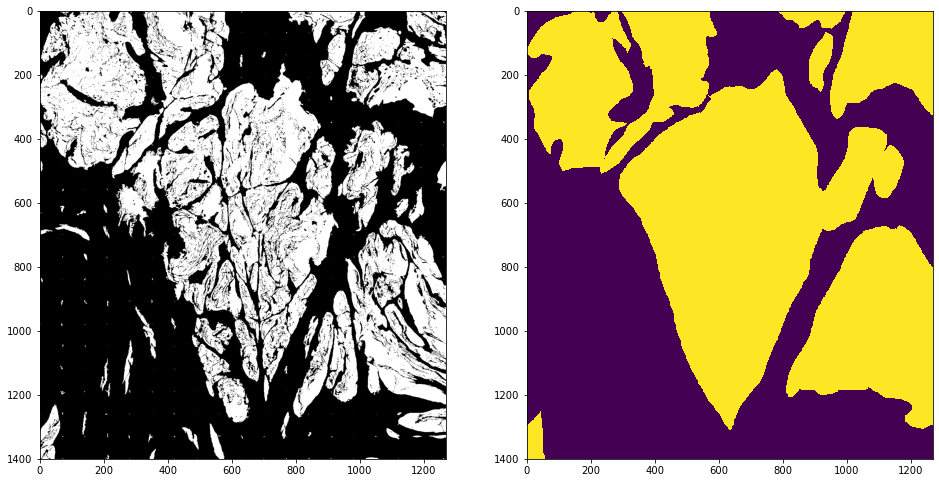

Error rate for region growing is : 0.20344468574456276


In [48]:
#Function to find all neighbours of a pixel
def get8n(x, y, shape):
    out = []
    maxx = shape[0]-1
    maxy = shape[1]-1
    
    #top left
    outx = min(max(x-1,0),maxx)
    outy = min(max(y-1,0),maxy)
    out.append((outx,outy))
    
    #top center
    outx = x
    outy = min(max(y-1,0),maxy)
    out.append((outx,outy))
    
    #top right
    outx = min(max(x+1,0),maxx)
    outy = min(max(y-1,0),maxy)
    out.append((outx,outy))
    
    #left
    outx = min(max(x-1,0),maxx)
    outy = y
    out.append((outx,outy))
    
    #right
    outx = min(max(x+1,0),maxx)
    outy = y
    out.append((outx,outy))
    
    #bottom left
    outx = min(max(x-1,0),maxx)
    outy = min(max(y+1,0),maxy)
    out.append((outx,outy))
    
    #bottom center
    outx = x
    outy = min(max(y+1,0),maxy)
    out.append((outx,outy))
    
    #bottom right
    outx = min(max(x+1,0),maxx)
    outy = min(max(y+1,0),maxy)
    out.append((outx,outy))
    
    return out
from scipy.stats import uniform
np.random.seed(0)

def region_growing_hard(img, seed, processed,p,thresh):
    seed_points = []
    outimg = np.zeros_like(img)
    seed_points.append((seed[0], seed[1]))
    while(len(seed_points) > 0):
        pix = seed_points[0]
        outimg[pix[0], pix[1]] = 255
        temp_sum = 0
        length = 0
        for coord in get8n(pix[0], pix[1], img.shape):
            temp_sum = img[coord[0], coord[1]] + temp_sum
            length = length + 1
        for coord in get8n(pix[0], pix[1], img.shape):      
            if img[coord[0], coord[1]] >150 or abs(img[coord[0], coord[1]] - temp_sum/length) < thresh:
                outimg[coord[0], coord[1]] = 255
                if processed[coord[0]][coord[1]]==False:
                    if uniform.rvs(0,1)>p:
                        seed_points.append(coord)   
                processed[coord[0]][coord[1]] = True
        seed_points.pop(0)
    return outimg


vect_max = np.vectorize(max)

def extract_objects_harder(img,step,p,thresh):
    processed = np.zeros_like(img)
    labels = np.zeros_like(img)
    I, J = img.shape
    max_label = 0
    outimg = np.zeros_like(img)
    i=0
    j=0
    while i<I:
        j=0
        while j<J:
            outimg = outimg + region_growing_hard(img,[i,j],processed,p,thresh)
            j+=step
        i+=step
    return (outimg>0)

mask_region = extract_objects_harder(adeno_img[:,:,1],step=70,p = 0.3,thresh=3.5)

fig, axs = plt.subplots(ncols=2,nrows=1,figsize = (16,10))

axs[0].imshow(mask_region, cmap = 'gray')
axs[1].imshow(adeno_gt, interpolation='nearest')
plt.show()
print('Error rate for region growing is :', 1- np.mean(adeno_gt == output))

---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

In [3]:
# Add your comments here
#The error for region growing can be reduced significantly by allowing more that the 8immediate neighbours to be used in the creation of the mask
#It is easy to see that we were able to find the broad outline of the regions in the mask, and if allowed, the same morphology procedure in part C
#Would improve the error rate

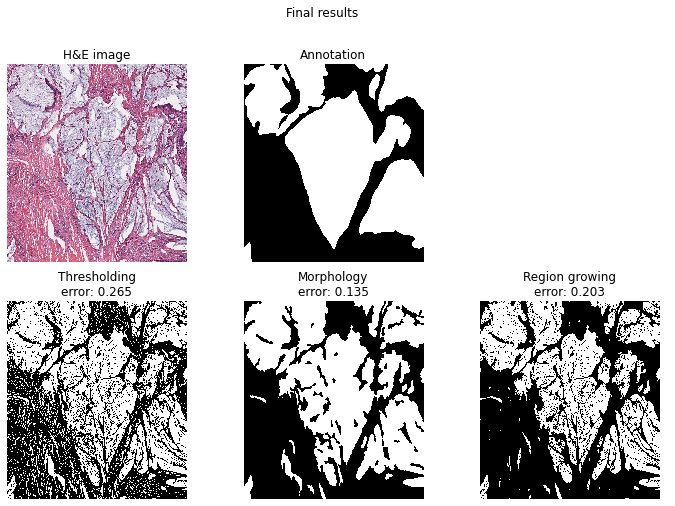

In [56]:
#mask_thesholding = np.zeros_like(adeno_gt)
error_th = 1- (mask_thesholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()


# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest',cmap='gray')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thesholding, interpolation='nearest',cmap='gray')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest',cmap='gray')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))


# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest',cmap='gray')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))


[a.axis('off') for a in ax.ravel()]


plt.suptitle("Final results")
plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments. 
**Using this image as reference** 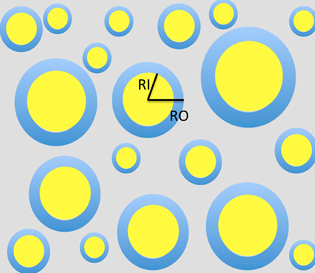

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) 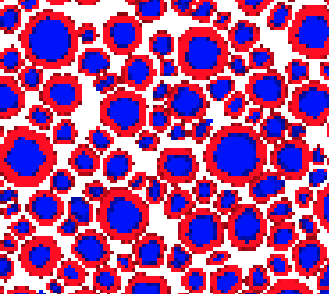

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

In [ ]:
#Define Functions which will be used later for both 2,1 and 2.2
import cv2

def grow(image, i, j, labels):
    I,J = image.shape
    #print(i,j,"label",labels[i][j])
    if labels[i][j] == 'na':
        labels[i][j] = 1
        for x,y in [(i+1,j),(i,j+1),(i-1,j),(i,j-1)]:
            if 0<=x<I and 0<=y<J and image[x][y]==image[i][j]:
                grow(image,x,y,labels)
    
def get8n(x, y, shape):
    out = []
    maxx = shape[0]-1
    maxy = shape[1]-1
    
    #top left
    outx = min(max(x-1,0),maxx)
    outy = min(max(y-1,0),maxy)
    out.append((outx,outy))
    
    #top center
    outx = x
    outy = min(max(y-1,0),maxy)
    out.append((outx,outy))
    
    #top right
    outx = min(max(x+1,0),maxx)
    outy = min(max(y-1,0),maxy)
    out.append((outx,outy))
    
    #left
    outx = min(max(x-1,0),maxx)
    outy = y
    out.append((outx,outy))
    
    #right
    outx = min(max(x+1,0),maxx)
    outy = y
    out.append((outx,outy))
    
    #bottom left
    outx = min(max(x-1,0),maxx)
    outy = min(max(y+1,0),maxy)
    out.append((outx,outy))
    
    #bottom center
    outx = x
    outy = min(max(y+1,0),maxy)
    out.append((outx,outy))
    
    #bottom right
    outx = min(max(x+1,0),maxx)
    outy = min(max(y+1,0),maxy)
    out.append((outx,outy))
    
    return out
    
def region_growing(img, seed, processed):
    seed_points = []
    outimg = np.zeros_like(img)
    seed_points.append((seed[0], seed[1]))
    while(len(seed_points) > 0):
        pix = seed_points[0]
        outimg[pix[0], pix[1]] = 255
        for coord in get8n(pix[0], pix[1], img.shape):
            if img[coord[0], coord[1]] != 0:
                outimg[coord[0], coord[1]] = 255
                if processed[coord[0]][coord[1]]==False:
                    seed_points.append(coord)
                processed[coord[0]][coord[1]] = True
        seed_points.pop(0)
        #plt.imshow(outimg)
        #cv2.waitKey(1)
    return outimg

def region_labelling(img, seed, labels,value):
    seed_points = []
    seed_points.append((seed[0], seed[1]))
    while(len(seed_points) > 0):
        pix = seed_points[0]
        for coord in get8n(pix[0], pix[1], img.shape):
            if img[coord[0], coord[1]] != 0:
                if labels[coord[0]][coord[1]]==0:
                    seed_points.append(coord)
                labels[coord[0]][coord[1]] = value
        seed_points.pop(0)

def extract_objects(image):
    labels = np.zeros_like(image)
    I, J = image.shape
    max_label = 0
    for i in range(I):
        for j in range(J):
            if image[i][j]>0 and labels[i][j]==0:
                region_labelling(img=image,seed=[i,j],labels=labels,value=max_label+1)
                max_label+=1
    return labels

### 2.1 SNR

data


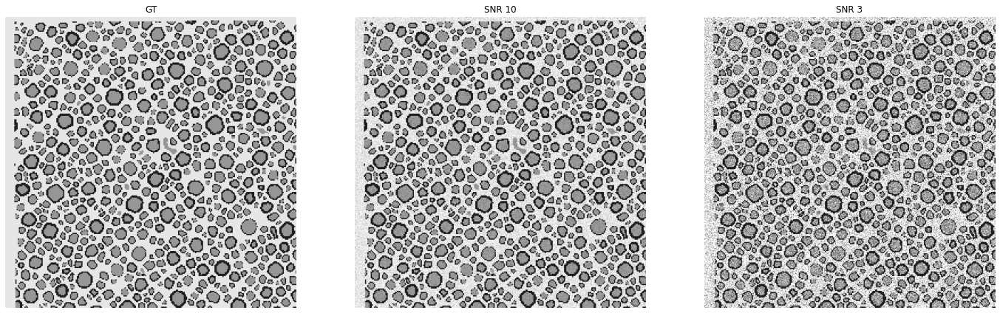

In [8]:
import cv2
import matplotlib.pyplot as plt

data_base_path = os.path.join( 'data')
print(data_base_path)
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = cv2.imread(path_folder+ files[0])
snr_10 = cv2.imread(path_folder+ files[1])
snr_3 = cv2.imread(path_folder+ files[2])

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.1 Preprocessing 

 % add your images after preprocessing


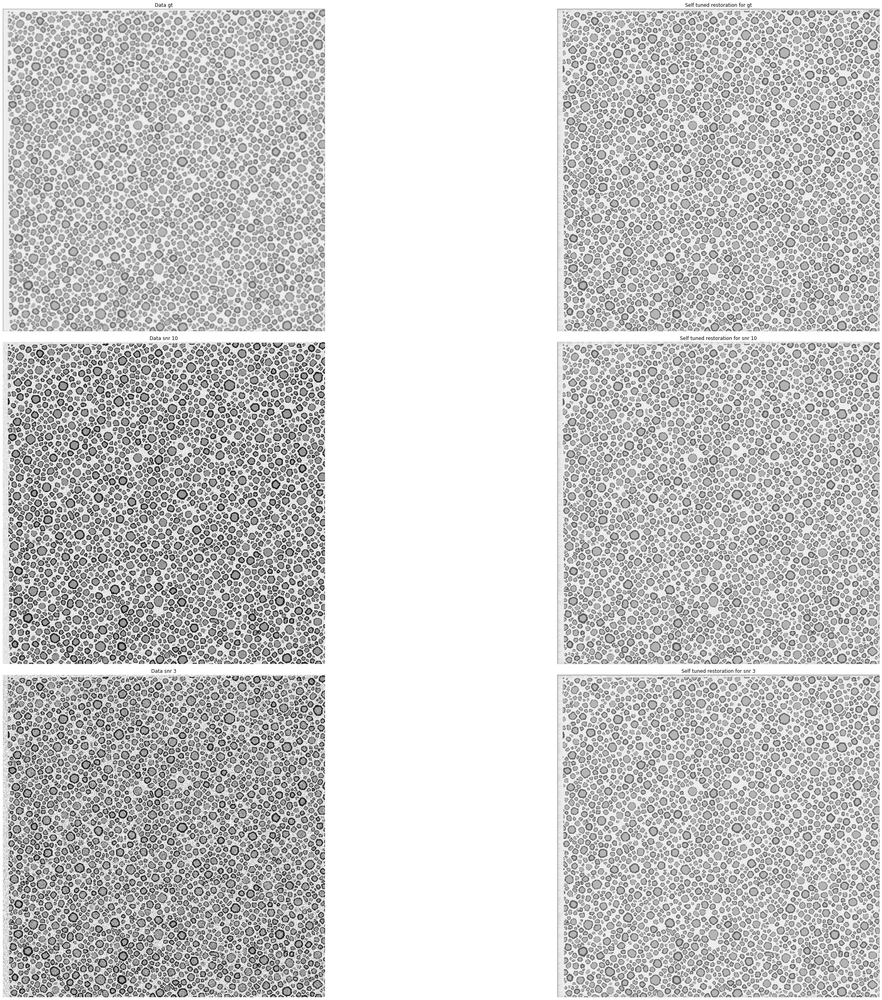

In [19]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import color, data, restoration, weiner

rng = np.random.default_rng()

from scipy.signal import convolve2d as conv2
psf = np.ones((4,4)) / 16
#got ground truth
astro_gt = conv2(color.rgb2gray(gt_0), psf, 'same')
astro_gt += 0.1 * astro_gt.std() * rng.standard_normal(astro_gt.shape)

deconvolved_gt, _ = restoration.unsupervised_wiener(astro_gt, psf)
#for snr 10
astro_10 = conv2(color.rgb2gray(snr_10), psf, 'same')
astro_10 += 0.1 * astro_10.std() * rng.standard_normal(astro_10.shape)

deconvolved_10, _ = restoration.unsupervised_wiener(astro_gt, psf)

#for snr 3
astro_3 = conv2(color.rgb2gray(snr_3), psf, 'same')
astro_3 += 0.1 * astro_3.std() * rng.standard_normal(astro_3.shape)

deconvolved_3, _ = restoration.unsupervised_wiener(astro_gt, psf)
#ploting
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(48, 35),
                       sharex=True, sharey=True)

plt.gray()

ax[0,0].imshow(astro_gt, vmin=deconvolved_gt.min(), vmax=deconvolved_gt.max())
ax[0,0].axis('off')
ax[0,0].set_title('Data gt')

ax[0,1].imshow(deconvolved_gt)
ax[0,1].axis('off')
ax[0,1].set_title('Self tuned restoration for gt')

ax[1,0].imshow(snr_10, vmin=deconvolved_10.min(), vmax=deconvolved_10.max())
ax[1,0].axis('off')
ax[1,0].set_title('Data snr 10')

ax[1,1].imshow(deconvolved_10)
ax[1,1].axis('off')
ax[1,1].set_title('Self tuned restoration for snr 10')

ax[2,0].imshow(snr_3, vmin=deconvolved_3.min(), vmax=deconvolved_3.max())
ax[2,0].axis('off')
ax[2,0].set_title('Data snr 3')

ax[2,1].imshow(deconvolved_3)
ax[2,1].axis('off')
ax[2,1].set_title('Self tuned restoration for snr 3')

fig.tight_layout()

plt.show()


### 2.1.2 Results Segmetations

C:\Users\Pranav\AppData\Local\Temp\ipykernel_2492\2697881951.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


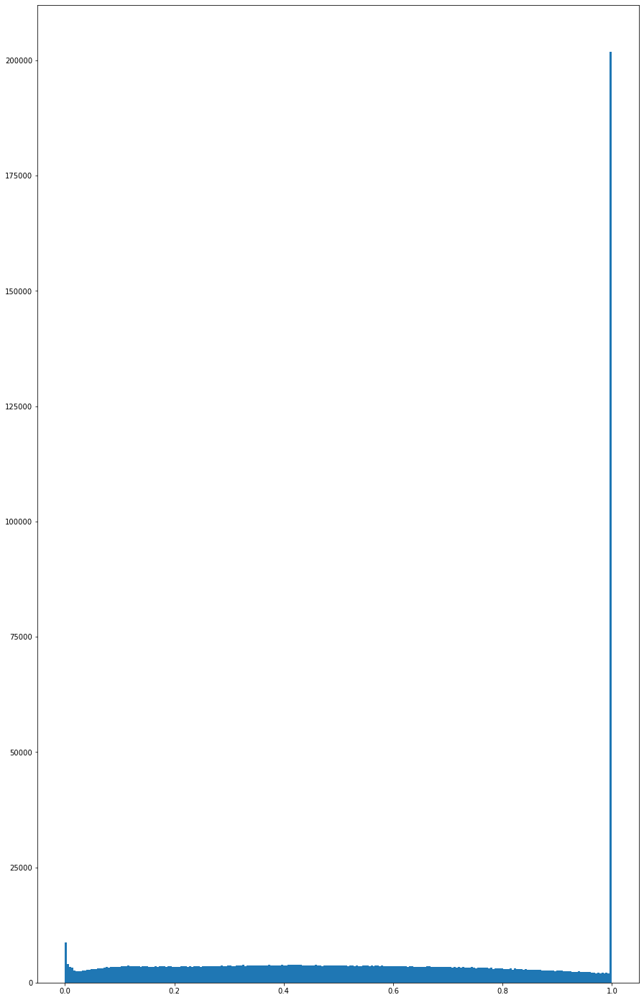

In [31]:
#deconvolved_10, _ = restoration.unsupervised_wiener(astro_gt, psf)
skimage.filters.wiener(data, impulse_response=None, filter_params={}, K=0.25, predefined_filter=None)


r_img = restoration.richardson_lucy(astro_10, psf, num_iter=30)t
r_img = deconvolved_10[:,:]

nb_bins = 256
fig, ax = plt.subplots(ncols = 1, figsize=(15,25))
plt.hist(r_img.flatten(), bins = nb_bins)
fig.show()

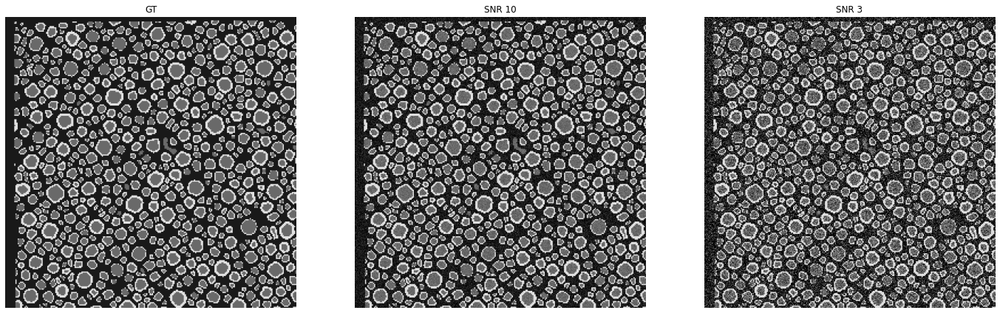

In [15]:
images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(255- im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.3 Radii histrograms 

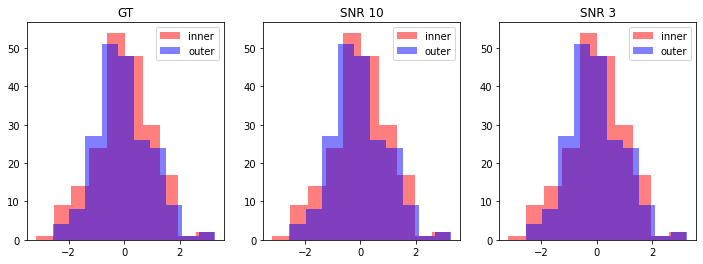

In [16]:
## results Radii distribution. proposal feel free to change it
import numpy as np


rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ rads_inner ,rads_outer]
rads_test0 = [ rads_inner ,rads_outer]  # your result
rads_test1 = [ rads_inner ,rads_outer]  # your result

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
plt.show()


### 2.2 Low frequencies

In [ ]:
files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder+ files[0])
lowfreq0 = cv2.imread(path_folder+ files[1])
lowfreq1 = cv2.imread(path_folder+ files[2])

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()
lowfreq0.shape

In [ ]:
### 2.2.1 Preprocessing for GT
def idk(x,colors):
    if x[0]==colors[0]:
        return np.array([255,0,0])
    if x[0]==colors[1]:
        return np.array([0,0,255])
    if x[0]==colors[2]:
        return np.array([255,255,255])
    
def paint(image):
    output = np.zeros_like(image)
    colors = np.unique(image.ravel())
    I, J = image.shape[:2]
    for i in range(I):
        for j in range(J):
            output[i][j] = idk(image[i][j],colors)
    return output

gt_3_painted = paint(gt_3)
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(gt_3_painted[:512,:512])
fig.show()

In [ ]:
### 2.2.2 Results Segmetations for GT
gt_3_gray = 1 - gt_3_painted[:,:,1]/255.0
plt.imshow(gt_3_gray,cmap='gray')
plt.show()
labelled_balls = extract_objects(gt_3_gray)
print(np.max(labelled_balls))
distinct_labels = range(1,int(np.max(labelled_balls)))
inner_balls = labelled_balls*(gt_3_painted[:,:,2]/255.0)
outer_areas = np.array([])
inner_areas = np.array([])
for i in distinct_labels:
    outer_areas = np.append(outer_areas,np.sum(labelled_balls==i))
    inner_areas = np.append(inner_areas,np.sum(inner_balls==i))

In [ ]:
### 2.2.3 Radii histrograms for GT
outer_radii = np.sqrt(outer_areas/np.pi) * 0.1
inner_radii = np.sqrt(inner_areas/np.pi) * 0.1
fig, ax = plt.subplots(ncols=2)
ax[0].hist(outer_radii,bins=24)
ax[1].hist(inner_radii,bins=24)
ax[0].set_title("outer radii")
ax[1].set_title("inner radii")
fig.show()

In [ ]:
#Now, we work with low frequency images
#Preprocessing
from skimage import filters
from scipy import ndimage
from skimage import restoration
#Filters as discussed in class
sharpen_filter_0=np.array([[-1,-1,-1],
                 [-1,9,-1],
                [-1,-1,-1]])
sharpen_filter_1=np.array([[1,-2,1],
                 [-2,5,-2],
                [1,-2,1]])
# applying kernels to the input image to get the sharpened image
#img_0 = lowfreq0_r[:100,:100]
sharp_image0=cv2.filter2D(lowfreq0,-1,sharpen_filter_0)
sharp_image1=cv2.filter2D(lowfreq0,-1,sharpen_filter_1)

median_filtered0 = filters.median(lowfreq0)
median_filtered1 = filters.median(lowfreq1)
deconvolved_img = restoration.unsupervised_wiener(rgb2gray(median_filtered0), psf)
#cv2.imshow('Required image',sharp_image0)
#cv2.waitKey(0)
#cv2.destroyAllWindows()
#plt.imshow()

# #See results fig, axs = plt.subplots(ncols=3,figsize=(24,8))
# axs[0].imshow(lowfreq0[0:256,0:256])
# axs[1].imshow(sharp_image0[0:256,0:256])
# axs[2].imshow(cv2.filter2D(median_filtered0,-1,sharpen_filter_0)[0:256,0:256,2],cmap='gray')
# plt.hist(lowfreq0_r.ravel(),bins=256)
# plt.show()
# plt.figure()
# plt.hist(gt_3.ravel(),bins=256)
# plt.show()
# plt.figure()
# plt.hist(median_filtered0.ravel(),bins=256)
# plt.show()
# plt.hist(cv2.filter2D(median_filtered0,-1,sharpen_filter_0).ravel(),bins=256)
# plt.show()
from skimage import morphology
img_0 = cv2.filter2D(median_filtered0,-1,sharpen_filter_0)
img_1 = cv2.filter2D(median_filtered0,-1,sharpen_filter_1)
thresh = 125

new_img_0 = (img_0>thresh)[:,:,2]
new_img_1 = (img_1>thresh)[:,:,2]

fig, axs = plt.subplots(ncols=3,figsize=(20,7))
axs[0].imshow(img_0[:256,:256])
axs[1].imshow(new_img_0[:256,:256],cmap='gray')
no_holes_0 = morphology.remove_small_holes(new_img_0,area_threshold=30,connectivity=2)
axs[2].imshow(no_holes_0[:256,:256],cmap='gray')
fig.show()


#Still not satisfactory, we try to improve it
fig, axs = plt.subplots(ncols=3,figsize=(20,7))
axs[1].imshow(morphology.binary_closing(no_holes_0, morphology.disk(radius=1))[:256,:256],cmap='gray')
axs[0].imshow(no_holes_0[:256,:256],cmap='gray')
no_holes_no_objects_0 = morphology.remove_small_objects(no_holes_0, 4)
axs[2].imshow(no_holes_no_objects_0[:256,:256],cmap='gray')
fig.show()




# print(3)
# # We should do this for lower freq in a speartate block or here? # fig, axs = plt.subplots(ncols=3,figsize=(20,7))
# # axs[0].imshow(img_0[:256,:256])
# # axs[1].imshow(new_img_0[:256,:256],cmap='gray')
# # no_holes_0 = morphology.remove_small_holes(new_img_0,area_threshold=30,connectivity=2)
# # axs[2].imshow(no_holes_0[:256,:256],cmap='gray')
# # fig.show()


# # #Still not satisfactory, we try to improve it
# # fig, axs = plt.subplots(ncols=3,figsize=(20,7))
# # axs[1].imshow(morphology.binary_closing(no_holes_0, morphology.disk(radius=1))[:256,:256],cmap='gray')
# # axs[0].imshow(no_holes_0[:256,:256],cmap='gray')
# # no_holes_no_objects_0 = morphology.remove_small_objects(no_holes_0, 4)
# # axs[2].imshow(no_holes_no_objects_0[:256,:256],cmap='gray')
# # fig.show()

In [ ]:
#Segmentation
bg = region_growing(no_holes_no_objects_0,
                           seed=[1,1],
                           processed=np.zeros_like(no_holes_no_objects_0))
new_img_1 = vect_int(no_holes_no_objects_0)*255.0
new_img_1[bg==True] = 150
plt.imshow(new_img_1[:256,:256],cmap='gray')
plt.show()



new_img_2 = np.copy(new_img_1)
new_img_2[new_img_2==255.0] = 120
new_img_2[new_img_2==150] = 255
fig, axs = plt.subplots(ncols=2,figsize=(12,6))
axs[0].imshow(new_img_2[:256,:256],cmap='gray')
axs[1].imshow(gt_3[:256,:256],cmap='gray')




median_filtered0 = filters.median(lowfreq0)
img_0 = cv2.filter2D(median_filtered0,-1,sharpen_filter_0)

thresh = 100
new_img_0 = (img_0>thresh)[:,:,2]
no_holes_0 = morphology.remove_small_holes(new_img_0,area_threshold=20,connectivity=2)
bg = region_growing(no_holes_no_objects_0,
                           seed=[1,1],
                           processed=np.zeros_like(no_holes_no_objects_0))
new_img_1 = vect_int(no_holes_no_objects_0)*255.0
new_img_1[bg==True] = 150
new_img_2 = np.copy(new_img_1)
new_img_2[new_img_2==255.0] = 120
new_img_2[new_img_2==150] = 255
new_img_2 = np.dstack([new_img_2,new_img_2,new_img_2])
new_image_painted = paint(new_img_2)
fig, ax = plt.subplots(figsize=(8,8))
ax.imshow(new_image_painted[:512,:512])
fig.show()

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

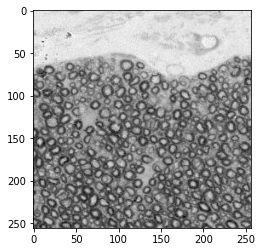

In [18]:
# Add your implementation and discussion
import cv2

files = ["extra_point.png" ]
real_data = cv2.imread(path_folder+ files[0])

plt.imshow(real_data[:256, :256])